# **Hands-On 2: CKGE: Foundations, Methods, and Open Challenges**

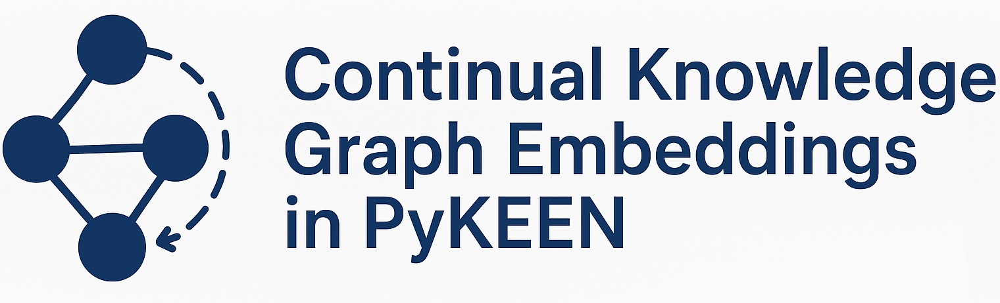

This is the notebook associated with the second part of the Tutorial "CKGE: Foundations, Methods, and Open Challenges". Here, we will see how to  add and exploit Continual Knowledge Graph Embeddings functionalities to the popular KGE library **PyKEEN**. As training KGE can be sped up by using GPUs, make sure to select a **Runtime type** that includes them. To follow this Notebook, first, make a copy this notebook and add it to your drive. Then, install the package as:

In [ ]:
!pip install git+https://github.com/gerardponsrecasens/CKGE-Lab

### Load the datasets

First of all, we need to give the Notebook access to our drive, in order to load the datasets. You can find the the dataset in the **GitHub repository** attached to the tutorial: [CKGE-FMOC](https://github.com/gerardponsrecasens/CKGE-FMOC)

Then, execute the following scripts. Please, make sure to **change the path** `'/content/drive/MyDrive/CKGE'` to the directory where you have imported the data and files.

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import sys, importlib
sys.path.insert(0, '/content/drive/MyDrive/CKGE')
importlib.invalidate_caches()

import os
PROJECT_ROOT = '/content/drive/MyDrive/CKGE'
os.chdir(PROJECT_ROOT)

In [ ]:
from ckge_utils.helper import *
from ckge_utils.train import *
from ckge_utils.expand_models import *

## **EXPANDING EMBEDDINGS**

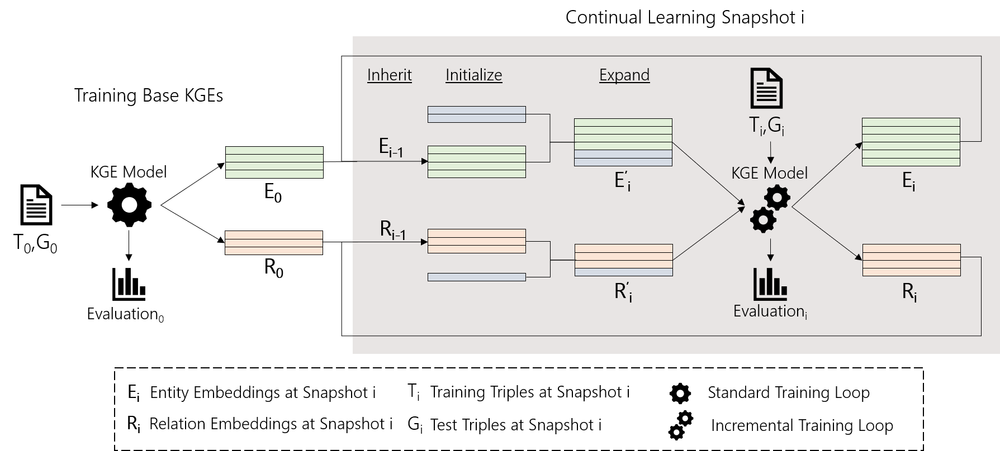

One of the basic functionalities is the **expansion** of the **embeddings** and **models** to accomodate incremental updates. This is, new triples are added to the KG which may contain **new entities and relations**. Therefore, the KGE model objects from PyKEEN are expanded, by inheriting past embeddings, properly initializing new ones and transferring the model past state to the new one. This has been implemented for **all unimodal KGE model** available in PyKEEN. The full list can be found in the GitHub repository.


A) We first start by training KGE embeddings with the **base snapshot**. For this tutorial we will use **TransH**.

In [ ]:
dataset_name = 'FBinc-S'
snapshot = 0
inverse_triples = False
embedding_dimension = 200
random_seed = 11
lr_0 = 0.001
lr_inc = 0.0001
epochs_0 = 5
epochs_inc = 5
device = 'cuda' if torch.cuda.is_available() else 'cpu'

train_tf, valid_tf, test_tf = create_triples_factory(dataset_name, snapshot, inverse_triples=inverse_triples)

In [ ]:
from pykeen.models import TransH
from pykeen.training import SLCWATrainingLoop
from pykeen.optimizers import Adam
from pykeen.evaluation import RankBasedEvaluator
from pykeen.stoppers import EarlyStopper

model = TransH(triples_factory=train_tf, embedding_dim=embedding_dimension, random_seed = random_seed)

model.to(device)

# Train with early stopping
optimizer = Adam(params=model.get_grad_params(), lr=lr_0)
stopper = EarlyStopper(
    model=model,
    evaluator=RankBasedEvaluator(),
    training_triples_factory=train_tf,
    evaluation_triples_factory=valid_tf,
    patience=2,
    frequency=10,
    metric="hits@3"
)
trainer = SLCWATrainingLoop(model=model, optimizer=optimizer, triples_factory=train_tf)
trainer.train(triples_factory=train_tf, num_epochs=epochs_0, batch_size=256, stopper=stopper)

INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-0fd4e16b-ad4a-45bb-b2f7-0831e55b47bb.pt


Training epochs on cuda:0:   0%|          | 0/5 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

[0.9398002247197912,
 0.7952729474513902,
 0.6286092258374626,
 0.4931591112132466,
 0.4089369322728673]

In [ ]:
model

TransH(
  (loss): MarginRankingLoss(
    (margin_activation): ReLU()
  )
  (interaction): TransHInteraction()
  (entity_representations): ModuleList(
    (0): Embedding(
      (_embeddings): Embedding(2909, 200)
    )
  )
  (relation_representations): ModuleList(
    (0-1): 2 x Embedding(
      (_embeddings): Embedding(233, 200)
    )
  )
  (weight_regularizers): ModuleList(
    (0): NormLimitRegularizer()
    (1): OrthogonalityRegularizer()
  )
)

B) Once we obtained our trained embeddings (which can be found inside the model object), we will **expand** the embeddings and the model. For that we will use the function:


```
switch_snapshot(model, entity_to_id, relation_to_id,
                model_name, snapshot, dataset, initialization, initilization_args)
```



In [ ]:
model, entity_to_id, relation_to_id = switch_snapshot(
      model=model,
      entity_to_id=train_tf.entity_to_id,
      relation_to_id=train_tf.relation_to_id,
      model_name='TransH',
      snapshot=1,
      dataset_name=dataset_name,
      initialization='random',
      initialization_args={},
      inverse_triples=inverse_triples
        )
model

INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()


TransH(
  (loss): MarginRankingLoss(
    (margin_activation): ReLU()
  )
  (interaction): TransHInteraction()
  (entity_representations): ModuleList(
    (0): Embedding(
      (_embeddings): Embedding(2919, 200)
    )
  )
  (relation_representations): ModuleList(
    (0-1): 2 x Embedding(
      (_embeddings): Embedding(233, 200)
    )
  )
  (weight_regularizers): ModuleList(
    (0): NormLimitRegularizer()
    (1): OrthogonalityRegularizer()
  )
)

C) Once we have our new model object, we can proceed the incremental learning phase. Importantly, we need to use the modified training loop **CKGETrainingLoop**.

In [ ]:
train_tf, valid_tf, test_tf = create_triples_factory(dataset_name, 1, entity_to_id, relation_to_id, inverse_triples=inverse_triples)
# Train again with early stopping
optimizer = Adam(params=model.get_grad_params(),lr=lr_inc)
stopper = EarlyStopper(
    model=model,
    evaluator=RankBasedEvaluator(),
    training_triples_factory=train_tf,
    evaluation_triples_factory=valid_tf,
    patience=2,
    frequency=10,
    metric="hits@3",
)
trainer = CKGETrainingLoop(model=model, optimizer=optimizer, triples_factory=train_tf)
trainer.train(triples_factory=train_tf, num_epochs=epochs_inc, batch_size=256, stopper=stopper)

INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-ce062bcd-6091-42b4-94c2-e9f0fa6fc59d.pt


Training epochs on cpu:   0%|          | 0/5 [00:00<?, ?epoch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cpu:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

[0.9793694019317627,
 0.9146124720573425,
 0.9462312459945679,
 0.8879503011703491,
 0.9352539777755737]

## **AUTOMATICALLY RUNNING CKGE EXPERIMENTS**

The previous procedure created the expanded model, embeddings and datasets. However, one still has to manually define the training loop, correctly evaluate the KGEs in the continual setting, and repeat the process for as many snapshots as present in the dataset. In order to facilitate this process, the function `train_ckge` has been implemented. This function allows to automatically run **end-to-end CKGE experiments** by just specifying the experiment setting:



*   **dataset_name**: the name of the dataset that one wants to evaluate. The dataset is expected to be stored inisde the */data* directory.
*   **number_snapshots**: how many snapshots need to be trained.
*   **embedding_dimension**: the dimension of the embeddings.
*   **lr_0**: the learning rate for the base snapshot.
*   **lr_inc**: the learning rate for the additional snapshots.
*   **epochs_0**: maximum number of training epoochs for the base snapshot.
*   **epochs_inc**: maximum number of training epoochs for the additional  snapshots.
*   **initialization_args**: dictionary specifying the initialization method (i.e., 'random' or 'schema') and the initialization arguments.
*   **dashboarding**: if a dashboard needs to be produced.
*   **random_seed**: random seed for reproducibility.


This training loop automatically computes **CKGE related metrics**.




In [ ]:
model, metrics = train_CKGE(embedding_model = 'TransH',
                   dataset_name='FBinc-S',
                   number_snapshots=5,
                   embedding_dimension = 200,
                   lr_0 = 0.001,
                   lr_inc = 0.0005,
                   epochs_0 = 200,
                   epochs_inc = 200,
                   random_seed = 11,
                   initialization_args={'method':'random','args':{}},
                   inverse_triples=False, dashboarding = True)

INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-938cb691-af7e-48b1-8a17-7ef9cd7c05b5.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.59s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.23528777753826255. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-938cb691-af7e-48b1-8a17-7ef9cd7c05b5.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.59s seconds


Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.59s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 30. The best result 0.23528777753826255 occurred at epoch 10.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-938cb691-af7e-48b1-8a17-7ef9cd7c05b5.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.00s seconds
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.05. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.1. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.125. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.15. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.09s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 60: 0.1625. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 60.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.2. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 80: 0.225. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 80.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.08s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 90: 0.3. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 90.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 100: 0.3125. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 100.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 110: 0.3375. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 110.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.08s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 130: 0.35. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 130.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 140: 0.3625. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 140.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.09s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 160: 0.375. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 160.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.09s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 180: 0.4. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 180.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 190: 0.425. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 190.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 200: 0.4375. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-310d01e6-6e79-42dd-904e-246e9e980d65.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 200.


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.73s seconds


Evaluating on cuda:0:   0%|          | 0.00/47.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.31s seconds
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-21572d74-f33d-4d3b-a714-4733139fd058.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.05357142857142857. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21572d74-f33d-4d3b-a714-4733139fd058.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.07142857142857142. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21572d74-f33d-4d3b-a714-4733139fd058.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.08s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 40. The best result 0.07142857142857142 occurred at epoch 20.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-21572d74-f33d-4d3b-a714-4733139fd058.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.73s seconds


Evaluating on cuda:0:   0%|          | 0.00/47.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.22s seconds


Evaluating on cuda:0:   0%|          | 0.00/39.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.23s seconds
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-0ebff73c-e72c-490d-8d14-f6b1ef5b3a84.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.10s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.0625. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-0ebff73c-e72c-490d-8d14-f6b1ef5b3a84.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.078125. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-0ebff73c-e72c-490d-8d14-f6b1ef5b3a84.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.05s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 40. The best result 0.078125 occurred at epoch 20.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-0ebff73c-e72c-490d-8d14-f6b1ef5b3a84.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.74s seconds


Evaluating on cuda:0:   0%|          | 0.00/47.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.23s seconds


Evaluating on cuda:0:   0%|          | 0.00/39.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.23s seconds


Evaluating on cuda:0:   0%|          | 0.00/43.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.24s seconds
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-5ce7e3e0-74d6-4478-bb55-535e582dcb96.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.07954545454545454. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-5ce7e3e0-74d6-4478-bb55-535e582dcb96.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 30. The best result 0.07954545454545454 occurred at epoch 10.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-5ce7e3e0-74d6-4478-bb55-535e582dcb96.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.76s seconds


Evaluating on cuda:0:   0%|          | 0.00/47.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.23s seconds


Evaluating on cuda:0:   0%|          | 0.00/39.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.24s seconds


Evaluating on cuda:0:   0%|          | 0.00/43.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.24s seconds


Evaluating on cuda:0:   0%|          | 0.00/57.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.24s seconds


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://c8d04bd3fa0990bd2c.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://c8d04bd3fa0990bd2c.gradio.live


## **INFORMED INITIALZATION**


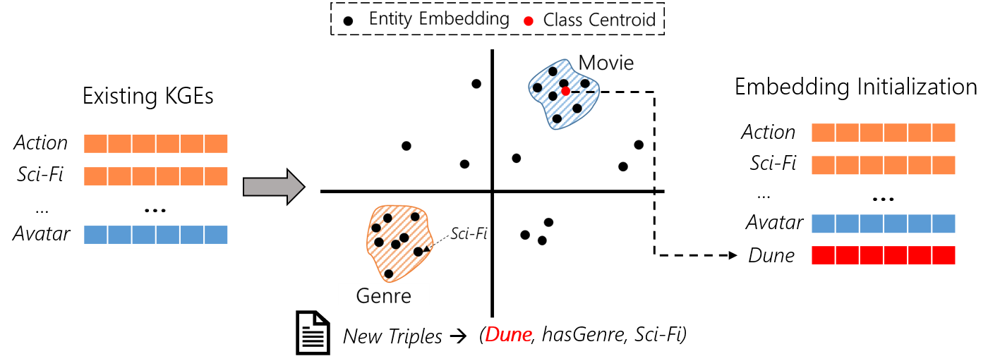

Finally, a method for informed initialization by using the KGs **schema information** is also available. This is supported for all the unimodal models in PyKEEN. It requires having a dictionary where each entity is associated with its *rdf:type* classes.

In [ ]:
with open('/content/drive/MyDrive/CKGE/dicts/dictionary_db.pkl', 'rb') as file:
    class_dict = pickle.load(file)

class_dict

{'/m/0ggx5q': ['http://dbpedia.org/ontology/Genre',
  'http://dbpedia.org/ontology/Agent',
  'http://dbpedia.org/ontology/TopicalConcept',
  'http://dbpedia.org/ontology/MusicGenre'],
 '/m/0gbwp': ['http://dbpedia.org/ontology/Person',
  'http://dbpedia.org/ontology/Animal',
  'http://dbpedia.org/ontology/Eukaryote',
  'http://dbpedia.org/ontology/Species',
  'http://dbpedia.org/ontology/Band',
  'http://dbpedia.org/ontology/MusicalArtist'],
 '/m/0gqwc': ['http://dbpedia.org/ontology/Award',
  'http://dbpedia.org/ontology/TelevisionShow'],
 '/m/0bzjgq': ['http://dbpedia.org/ontology/Person'],
 '/m/02vx4': ['http://dbpedia.org/ontology/Activity',
  'http://dbpedia.org/ontology/Sport'],
 '/m/0lgxj': ['http://dbpedia.org/ontology/SocietalEvent',
  'http://dbpedia.org/ontology/Event',
  'http://dbpedia.org/ontology/Olympics',
  'http://dbpedia.org/ontology/SportsEvent'],
 '/m/0bwfn': ['http://dbpedia.org/ontology/Agent',
  'http://dbpedia.org/ontology/EducationalInstitution',
  'http://dbp

In [ ]:
init_args = {'class_dict':class_dict, 'random_noise': 0.5}

model, metrics_schema = train_CKGE(embedding_model = 'TransH',
                   dataset_name='FBinc-S',
                   number_snapshots=5,
                   embedding_dimension = 200,
                   lr_0 = 0.001,
                   lr_inc = 0.0005,
                   epochs_0 = 200,
                   epochs_inc = 200,
                   random_seed = 11,
                   initialization_args={'method':'schema','args':init_args},
                   inverse_triples=False, dashboarding = True)

INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-400baf9c-7a3b-4192-b306-a3c6e0402dc3.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.62s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.23528777753826255. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-400baf9c-7a3b-4192-b306-a3c6e0402dc3.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.64s seconds


Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/109 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.59s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 30. The best result 0.23528777753826255 occurred at epoch 10.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-400baf9c-7a3b-4192-b306-a3c6e0402dc3.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.04s seconds
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.1125. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.175. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.08s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.2125. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.2875. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 50: 0.3625. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 50.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 60: 0.3875. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 60.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.4125. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 90. The best result 0.4125 occurred at epoch 70.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-7ad39081-1934-4eb9-b4e9-135f9ef9529b.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.73s seconds


Evaluating on cuda:0:   0%|          | 0.00/47.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.30s seconds
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-ca58ea90-5d6b-4054-b729-77997a5b04ba.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.17857142857142858. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-ca58ea90-5d6b-4054-b729-77997a5b04ba.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.21428571428571427. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-ca58ea90-5d6b-4054-b729-77997a5b04ba.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.05s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.26785714285714285. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-ca58ea90-5d6b-4054-b729-77997a5b04ba.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 50: 0.2857142857142857. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-ca58ea90-5d6b-4054-b729-77997a5b04ba.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 50.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.10s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.35714285714285715. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-ca58ea90-5d6b-4054-b729-77997a5b04ba.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 80: 0.39285714285714285. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-ca58ea90-5d6b-4054-b729-77997a5b04ba.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 80.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 100. The best result 0.39285714285714285 occurred at epoch 80.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-ca58ea90-5d6b-4054-b729-77997a5b04ba.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.71s seconds


Evaluating on cuda:0:   0%|          | 0.00/47.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.21s seconds


Evaluating on cuda:0:   0%|          | 0.00/39.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.21s seconds
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.05s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.140625. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.08s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.15625. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.05s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.1875. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 40: 0.265625. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 40.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 50: 0.375. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 50.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.05s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.46875. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 80: 0.515625. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 80.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 100: 0.53125. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 100.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.05s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 120. The best result 0.53125 occurred at epoch 100.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-21c083ca-0426-4ce3-8f3f-0a7f4e24745a.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.73s seconds


Evaluating on cuda:0:   0%|          | 0.00/47.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.23s seconds


Evaluating on cuda:0:   0%|          | 0.00/39.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.22s seconds


Evaluating on cuda:0:   0%|          | 0.00/43.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.24s seconds
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.nn.representation:Inferred unique=False for Embedding()
INFO:pykeen.stoppers.early_stopping:Inferred checkpoint path for best model weights: /root/.data/pykeen/checkpoints/best-model-weights-eacad95f-fcbc-41a7-992b-64baac897ac1.pt


Training epochs on cuda:0:   0%|          | 0/200 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.09s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 10: 0.18181818181818182. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-eacad95f-fcbc-41a7-992b-64baac897ac1.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 10.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 20: 0.25. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-eacad95f-fcbc-41a7-992b-64baac897ac1.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 20.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.05s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 30: 0.2840909090909091. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-eacad95f-fcbc-41a7-992b-64baac897ac1.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 30.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.10s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 50: 0.29545454545454547. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-eacad95f-fcbc-41a7-992b-64baac897ac1.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 50.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 60: 0.3181818181818182. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-eacad95f-fcbc-41a7-992b-64baac897ac1.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 60.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.07s seconds
INFO:pykeen.stoppers.early_stopping:New best result at epoch 70: 0.3522727272727273. Saved model weights to /root/.data/pykeen/checkpoints/best-model-weights-eacad95f-fcbc-41a7-992b-64baac897ac1.pt
INFO:pykeen.training.training_loop:=> Saved checkpoint after having finished epoch 70.


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.06s seconds


Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0.00/1.00 [00:00<?, ?batch/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.08s seconds
INFO:pykeen.stoppers.early_stopping:Stopping early at epoch 90. The best result 0.3522727272727273 occurred at epoch 70.
INFO:pykeen.stoppers.early_stopping:Re-loading weights from best epoch from /root/.data/pykeen/checkpoints/best-model-weights-eacad95f-fcbc-41a7-992b-64baac897ac1.pt


Evaluating on cuda:0:   0%|          | 0.00/9.28k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 2.75s seconds


Evaluating on cuda:0:   0%|          | 0.00/47.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.22s seconds


Evaluating on cuda:0:   0%|          | 0.00/39.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.28s seconds


Evaluating on cuda:0:   0%|          | 0.00/43.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.24s seconds


Evaluating on cuda:0:   0%|          | 0.00/57.0 [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.26s seconds


It looks like you are running Gradio on a hosted Jupyter notebook, which requires `share=True`. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. This cell will run indefinitely so that you can see errors and logs. To turn off, set debug=False in launch().
* Running on public URL: https://fa942c68e0832f2132.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


Keyboard interruption in main thread... closing server.
Killing tunnel 127.0.0.1:7860 <> https://fa942c68e0832f2132.gradio.live


In [ ]:
metrics

,Ω_old,Ω_new,mrr,hits@1,hits@3,hits@10
0,0.701,0.164,0.218,0.111,0.254,0.428


In [ ]:
metrics_schema

,Ω_old,Ω_new,mrr,hits@1,hits@3,hits@10
0,0.858,0.368,0.27,0.166,0.308,0.473
